In [1]:
import os
import cv2
import keras
import numpy as np
from glob import glob
import tensorflow as tf
import matplotlib.pyplot as plt

from tensorflow.keras import layers
from tensorflow.keras.layers import Input, Conv2D, Conv2DTranspose, concatenate, BatchNormalization, Activation, Dropout
from tensorflow.keras.models import Model
from tensorflow.keras.applications import VGG19
from tensorflow.keras.callbacks import EarlyStopping, ReduceLROnPlateau
from tensorflow.keras.metrics import Recall, Precision
from tensorflow.keras import backend as K

AUTOTUNE = tf.data.experimental.AUTOTUNE
print(f"Tensorflow ver. {tf.__version__}")

2024-05-28 11:53:32.163426: I tensorflow/core/platform/cpu_feature_guard.cc:210] This TensorFlow binary is optimized to use available CPU instructions in performance-critical operations.
To enable the following instructions: AVX2 FMA, in other operations, rebuild TensorFlow with the appropriate compiler flags.
2024-05-28 11:53:32.759021: W tensorflow/compiler/tf2tensorrt/utils/py_utils.cc:38] TF-TRT Warning: Could not find TensorRT


Tensorflow ver. 2.16.1


/home/sukrit/.local/lib/python3.10/site-packages/matplotlib/projections/__init__.py:63: UserWarning: Unable to import Axes3D. This may be due to multiple versions of Matplotlib being installed (e.g. as a system package and as a pip package). As a result, the 3D projection is not available.
  warnings.warn("Unable to import Axes3D. This may be due to multiple versions of "


In [2]:
# Input image size that we are going to use
IMAGE_SIZE = 512
num_classes = 4
# Set batch size
batch = 16
# Set learning rate
LR = 1e-4
# Set epoch
EPOCHS = 70

In [3]:
# Set image and mask paths
image_path = "../../Datasets/IE-dataset-All-tts-augmented/images/"
mask_path = "../../Datasets/IE-dataset-All-tts-augmented/masks/"
training_data = "train/"
val_data = "validation/"
test_data = "test/"

In [4]:
# Function to create lists of paths for training, validation and testing data
def load_data():
  extensions = ["*.jpg", "*.tif", "*.tiff"]
  file_patterns = [os.path.join(image_path, training_data, ext) for ext in extensions]

  TRAIN_X = sorted(sum((glob(pattern) for pattern in file_patterns), []))
  # TRAIN_X = sorted(glob(os.path.join(image_path + training_data, "*.jpg")))
  train_x = TRAIN_X
# image_path
  TRAIN_Y = sorted(glob(os.path.join(mask_path + training_data, "*.png")))
  train_y = TRAIN_Y

  file_patterns = [os.path.join(image_path, val_data, ext) for ext in extensions]
  VALID_TEST_X = sorted(sum((glob(pattern) for pattern in file_patterns), []))
  # VALID_TEST_X = sorted(glob(os.path.join(image_path + val_data, "*.jpg")))
  valid_x = VALID_TEST_X

  VALID_TEST_Y = sorted(glob(os.path.join(mask_path + val_data, "*.png")))
  valid_y = VALID_TEST_Y

  file_patterns = [os.path.join(image_path, test_data, ext) for ext in extensions]
  TEST_X = sorted(sum((glob(pattern) for pattern in file_patterns), []))
  test_x = TEST_X
  TEST_Y = sorted(glob(os.path.join(mask_path + test_data, "*.png")))
  test_y = TEST_Y

  return (train_x, train_y), (valid_x, valid_y), (test_x, test_y)

In [5]:
(train_x, train_y), (valid_x, valid_y), (test_x, test_y) = load_data()

print("Training data: ", len(train_x))
print("Validation data: ", len(valid_x))
print("Test data: ", len(test_x))

Training data:  308
Validation data:  16
Test data:  15


In [6]:
# Set image augmentation (to be called by tensorflow dataset later)
data_augmentation = tf.keras.Sequential([
  # layers.RandomFlip("horizontal_and_vertical"),
  # layers.RandomRotation(0.2),
  # layers.RandomZoom(.5, .2),
  # layers.RandomContrast(0.1)
  ],
  )

In [7]:
# Functions to read image and mask paths to output numpy arrays
def read_image(path):
    path = path.decode()
    x = cv2.imread(path, cv2.IMREAD_COLOR)
    x = cv2.resize(x, (IMAGE_SIZE, IMAGE_SIZE))
    x = x/255.0
    return x

def read_mask(path):
    path = path.decode()
    x = cv2.imread(path, cv2.IMREAD_GRAYSCALE)
    x = cv2.resize(x, (IMAGE_SIZE, IMAGE_SIZE))
    x = np.expand_dims(x, axis=-1)
    return x

In [8]:
# Function to generate tensorflow dataset 
def tf_parse(x, y):
    def _parse(x, y):
        x = read_image(x)
        y = read_mask(y)
        return x, y

    x, y = tf.numpy_function(_parse, [x, y], [tf.float64, tf.uint8])
    x.set_shape([IMAGE_SIZE, IMAGE_SIZE, 3])
    y.set_shape([IMAGE_SIZE, IMAGE_SIZE, 1])
    return x, y

num_threads = 4

def tf_dataset_train(x, y, batch=batch):
    dataset = tf.data.Dataset.from_tensor_slices((x, y))
    dataset = dataset.shuffle(buffer_size=5000)
    dataset = dataset.repeat()
    dataset = dataset.map(tf_parse, num_parallel_calls=num_threads)
    dataset = dataset.batch(batch)
    # newdataset = dataset.map(lambda x, y: (data_augmentation(x, training=True), y), num_parallel_calls=tf.data.AUTOTUNE)
    dataset = dataset.prefetch(1)
    return dataset
    


def tf_dataset_valid(x, y, batch=batch):
    dataset = tf.data.Dataset.from_tensor_slices((x, y))
    dataset = dataset.shuffle(buffer_size=500)
    dataset = dataset.repeat()
    dataset = dataset.map(tf_parse, num_parallel_calls=num_threads)
    dataset = dataset.batch(batch)
    dataset = dataset.prefetch(1)
    return dataset

In [9]:
train_dataset = tf_dataset_train(train_x, train_y)
valid_dataset = tf_dataset_valid(valid_x, valid_y)
test_dataset = tf_dataset_valid(test_x, test_y)

2024-05-28 11:53:34.602332: E external/local_xla/xla/stream_executor/cuda/cuda_driver.cc:282] failed call to cuInit: CUDA_ERROR_COMPAT_NOT_SUPPORTED_ON_DEVICE: forward compatibility was attempted on non supported HW
2024-05-28 11:53:34.602355: I external/local_xla/xla/stream_executor/cuda/cuda_diagnostics.cc:134] retrieving CUDA diagnostic information for host: ipsa-MS-7B98
2024-05-28 11:53:34.602361: I external/local_xla/xla/stream_executor/cuda/cuda_diagnostics.cc:141] hostname: ipsa-MS-7B98
2024-05-28 11:53:34.602429: I external/local_xla/xla/stream_executor/cuda/cuda_diagnostics.cc:165] libcuda reported version is: 535.171.4
2024-05-28 11:53:34.602449: I external/local_xla/xla/stream_executor/cuda/cuda_diagnostics.cc:169] kernel reported version is: 470.239.6
2024-05-28 11:53:34.602454: E external/local_xla/xla/stream_executor/cuda/cuda_diagnostics.cc:251] kernel version 470.239.6 does not match DSO version 535.171.4 -- cannot find working devices in this configuration


In [10]:
# Function to load image/mask and convert colour space from BGR to RGB so that image/mask can be displayed correctly by matplotlib
def read_and_rgb(x):
    x = cv2.imread(x)
    x = cv2.cvtColor(x, cv2.COLOR_BGR2RGB)
    return x

In [11]:
# Function for conv2d_block (to be used for building decoder of unet)
def conv2d_block(input_tensor, n_filters, kernel_size = 3, batchnorm = True):
    x = Conv2D(filters = n_filters, kernel_size = (kernel_size, kernel_size), kernel_initializer = 'he_normal', padding = 'same')(input_tensor)
    if batchnorm:
        x = BatchNormalization()(x)
    x = Activation('relu')(x)
    return x

In [12]:
# Function for unet model creation
def unet(n_filters = 16, batchnorm = True, dropout = 0.1, num_classes=4):

    # Contracting Path (encoder)
    inputs = Input(shape=(IMAGE_SIZE, IMAGE_SIZE, 3), name="input_image")
    encoder = VGG19(input_tensor=inputs, include_top=False,weights="imagenet")
    # BASE_WEIGHT_PATH = ('https://github.com/fchollet/deep-learning-models/releases/download/v0.1/')
    # model_name = 'resnet50_weights_tf_dim_ordering_tf_kernels.h5'
    # weight_path = BASE_WEIGHT_PATH + model_name
    # weights_path = keras.utils.get_file(model_name, weight_path)
    # encoder.load_weights(weights_path, by_name=True, skip_mismatch=True)

    skip_connection_names = ["block1_conv2", "block2_conv2", "block3_conv3", "block4_conv3","block5_conv3"]
    encoder_output = encoder.get_layer("block5_pool").output

    x = encoder_output
    x_skip_1 = encoder.get_layer(skip_connection_names[-1]).output # 224x224
    x_skip_2 = encoder.get_layer(skip_connection_names[-2]).output # 112x112
    x_skip_3 = encoder.get_layer(skip_connection_names[-3]).output # 56x56
    x_skip_4 = encoder.get_layer(skip_connection_names[-4]).output # 28x28
    x_skip_5 = encoder.get_layer(skip_connection_names[-5]).output # 14x14


    # Expansive Path (decoder)
    u6 = Conv2DTranspose(n_filters * 13, (3, 3), strides = (2, 2), padding = 'same')(x)
    u6 = concatenate([u6, x_skip_1])
    c6 = conv2d_block(u6, n_filters * 13, kernel_size = 3, batchnorm = batchnorm)
    p6 = Dropout(dropout)(c6)

    u7 = Conv2DTranspose(n_filters * 12, (3, 3), strides = (2, 2), padding = 'same')(c6)
    u7 = concatenate([u7, x_skip_2])
    c7 = conv2d_block(u7, n_filters * 12, kernel_size = 3, batchnorm = batchnorm)
    p7 = Dropout(dropout)(c7)

    u8 = Conv2DTranspose(n_filters * 11, (3, 3), strides = (2, 2), padding = 'same')(p7)
    u8 = concatenate([u8, x_skip_3])
    c8 = conv2d_block(u8, n_filters * 11, kernel_size = 3, batchnorm = batchnorm)
    p7 = Dropout(dropout)(c8)

    u9 = Conv2DTranspose(n_filters * 10, (3, 3), strides = (2, 2), padding = 'same')(c8)
    u9 = concatenate([u9, x_skip_4])
    c9 = conv2d_block(u9, n_filters * 10, kernel_size = 3, batchnorm = batchnorm)
    
    u10 = Conv2DTranspose(n_filters * 9, (3, 3), strides = (2, 2), padding = 'same')(c9)
    u10 = concatenate([u10, x_skip_5])
    c10 = conv2d_block(u10, n_filters * 9, kernel_size = 3, batchnorm = batchnorm)
    outputs = Conv2D(num_classes, (1, 1), activation='softmax')(c10)

    model = Model(inputs=inputs, outputs=outputs)
    
    return model

In [13]:
model = unet(n_filters = 16, batchnorm = True, dropout = 0.1, num_classes=4)

In [14]:
# tf.keras.utils.plot_model(model,show_shapes=True)

In [15]:
# Specify all the encoder layers in a list
encoder_layers = model.layers[0:-27]

In [16]:
# Freeze the encoder layers for transfer learning (so that weights are only Augmentedchanged for the decoder layers druing training)
for layer in encoder_layers:
    layer.trainable = False
    # print(layer, layer.trainable)

In [17]:
model.summary()

Model: "functional_1"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_image         │ (None, 512, 512,  │          0 │ -                 │
│ (InputLayer)        │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block1_conv1        │ (None, 512, 512,  │      1,792 │ input_image[0][0] │
│ (Conv2D)            │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block1_conv2        │ (None, 512, 512,  │     36,928 │ block1_conv1[0][… │
│ (Conv2D)            │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block1_pool         │ (None, 256, 256,  │          0 │ block1_conv2[0][… │
│ (MaxPooling2D)      │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block2_conv1        │ (None, 256, 256,  │     73,856 │ block1_pool[0][0] │
│ (Conv2D)            │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block2_conv2        │ (None, 256, 256,  │    147,584 │ block2_conv1[0][… │
│ (Conv2D)            │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block2_pool         │ (None, 128, 128,  │          0 │ block2_conv2[0][… │
│ (MaxPooling2D)      │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block3_conv1        │ (None, 128, 128,  │    295,168 │ block2_pool[0][0] │
│ (Conv2D)            │ 256)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block3_conv2        │ (None, 128, 128,  │    590,080 │ block3_conv1[0][… │
│ (Conv2D)            │ 256)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block3_conv3        │ (None, 128, 128,  │    590,080 │ block3_conv2[0][… │
│ (Conv2D)            │ 256)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block3_conv4        │ (None, 128, 128,  │    590,080 │ block3_conv3[0][… │
│ (Conv2D)            │ 256)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block3_pool         │ (None, 64, 64,    │          0 │ block3_conv4[0][… │
│ (MaxPooling2D)      │ 256)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block4_conv1        │ (None, 64, 64,    │  1,180,160 │ block3_pool[0][0] │
│ (Conv2D)            │ 512)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block4_conv2        │ (None, 64, 64,    │  2,359,808 │ block4_conv1[0][… │
│ (Conv2D)            │ 512)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block4_conv3        │ (None, 64, 64,    │  2,359,808 │ block4_conv2[0][… │
│ (Conv2D)            │ 512)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block4_conv4        │ (None, 64, 64,    │  2,359,808 │ block4_conv3[0][… │
│ (Conv2D)            │ 512)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block4_pool         │ (None, 32, 32,    │          0 │ block4_conv4[0][

 Total params: 26,045,988 (99.36 MB)

 Trainable params: 6,019,844 (22.96 MB)

 Non-trainable params: 20,026,144 (76.39 MB)

In [18]:
# Functions for dice coefficient and dice loss 

import tensorflow.keras.backend as K

def dice_coef(y_true, y_pred, smooth=1e-7):
    y_true_f = K.flatten(K.one_hot(K.cast(y_true, 'int32'), num_classes=4)[Ellipsis,1:])
    y_pred_f = K.flatten(y_pred[...,1:])
    intersect = K.sum(y_true_f * y_pred_f, axis=-1)
    true_sum = K.sum(y_true_f , axis=-1)
    pred_sum = K.sum(y_pred_f, axis=-1)
    return K.mean((2. * intersect / (true_sum+pred_sum + smooth)))

def dice_loss(y_true, y_pred):
    return 1 - dice_coef(y_true, y_pred)

def mean_iou(y_true, y_pred, num_classes=4):
  smooth = 1e-7  
  y_true_f = K.flatten(K.one_hot(K.cast(y_true, 'int32'), num_classes=num_classes)[..., 1:])
  y_pred_f = K.flatten(y_pred[..., 1:])
  intersection = K.sum(K.cast(y_true_f * y_pred_f, dtype='float32'), axis=-1)
  set_sum = K.sum(K.cast(y_true_f + y_pred_f, dtype='float32'), axis=-1)
  iou = (intersection + smooth) / (set_sum -intersection+ smooth)
  mIoU = K.mean(iou)
  return mIoU

def mIoU_loss(y_true, y_pred):
    return 1 - mean_iou(y_true, y_pred)
   


In [19]:
# Set up loss function, optimiser and complile the model 
opt = tf.keras.optimizers.AdamW(LR)
metrics = [dice_coef,mean_iou]
model.compile(loss=dice_loss, optimizer=opt, metrics=metrics)
#model.compile(optimizer=opt, loss = tf.keras.losses.SparseCategoricalCrossentropy(),metrics=['accuracy'])

In [20]:
# Set up early stopping and reduce learning rate on plateau
early_stopping = EarlyStopping(
    monitor='mean_iou', 
    patience=4, 
    mode='max'
)

reduce_lr = ReduceLROnPlateau(
    monitor='mean_iou', 
    factor=0.3,   
    patience=4, 
    min_lr=0.0001,
)


In [21]:
# Set up checkpoint for saving model architecture and weights
checkpoint_filepath = 'checkpoint.model.keras'
model_checkpoint_callback = tf.keras.callbacks.ModelCheckpoint(
    filepath=checkpoint_filepath,
    save_weights_only=False,
    monitor='mean_iou',
    mode='max',
    save_best_only=True)

In [22]:
# Commencement of training
train_steps = len(train_x)//batch
valid_steps = len(valid_x)//batch

if len(train_x) % batch != 0: 
    train_steps += 1
if len(valid_x) % batch != 0: 
    valid_steps += 1

history=model.fit(
    train_dataset,
    validation_data = valid_dataset,
    epochs=EPOCHS,
    steps_per_epoch=train_steps,
    validation_steps=valid_steps,
    callbacks=[model_checkpoint_callback,early_stopping,reduce_lr]
)


Epoch 1/70
20/20 ━━━━━━━━━━━━━━━━━━━━ 807s 40s/step - dice_coef: 0.4359 - loss: 0.5641 - mean_iou: 0.2870 - val_dice_coef: 0.4993 - val_loss: 0.5007 - val_mean_iou: 0.3327 - learning_rate: 1.0000e-04
Epoch 2/70
20/20 ━━━━━━━━━━━━━━━━━━━━ 806s 40s/step - dice_coef: 0.6932 - loss: 0.3068 - mean_iou: 0.5323 - val_dice_coef: 0.5021 - val_loss: 0.4979 - val_mean_iou: 0.3352 - learning_rate: 1.0000e-04
Epoch 3/70
20/20 ━━━━━━━━━━━━━━━━━━━━ 812s 41s/step - dice_coef: 0.7585 - loss: 0.2415 - mean_iou: 0.6133 - val_dice_coef: 0.5101 - val_loss: 0.4899 - val_mean_iou: 0.3424 - learning_rate: 1.0000e-04
Epoch 4/70
20/20 ━━━━━━━━━━━━━━━━━━━━ 806s 40s/step - dice_coef: 0.7827 - loss: 0.2173 - mean_iou: 0.6470 - val_dice_coef: 0.5419 - val_loss: 0.4581 - val_mean_iou: 0.3717 - learning_rate: 1.0000e-04
Epoch 5/70
20/20 ━━━━━━━━━━━━━━━━━━━━ 801s 40s/step - dice_coef: 0.7858 - loss: 0.2142 - mean_iou: 0.6489 - val_dice_coef: 0.5461 - val_loss: 0.4539 - val_mean_iou: 0.3756 - learning_rate: 1.0000e-04


In [30]:
historyVAL=model.fit(
    valid_dataset,
    validation_data = valid_dataset,
    epochs=20,
    steps_per_epoch=valid_steps,
    validation_steps=valid_steps,
    callbacks=[model_checkpoint_callback,early_stopping,reduce_lr]
)

Epoch 1/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 55s 55s/step - dice_coef: 0.8632 - loss: 0.1368 - mean_iou: 0.7594 - val_dice_coef: 0.8898 - val_loss: 0.1102 - val_mean_iou: 0.8014 - learning_rate: 1.0000e-04
Epoch 2/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 55s 55s/step - dice_coef: 0.8685 - loss: 0.1315 - mean_iou: 0.7675 - val_dice_coef: 0.8906 - val_loss: 0.1094 - val_mean_iou: 0.8028 - learning_rate: 1.0000e-04
Epoch 3/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 55s 55s/step - dice_coef: 0.8728 - loss: 0.1272 - mean_iou: 0.7744 - val_dice_coef: 0.8893 - val_loss: 0.1107 - val_mean_iou: 0.8007 - learning_rate: 1.0000e-04
Epoch 4/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 55s 55s/step - dice_coef: 0.8758 - loss: 0.1242 - mean_iou: 0.7790 - val_dice_coef: 0.8871 - val_loss: 0.1129 - val_mean_iou: 0.7971 - learning_rate: 1.0000e-04


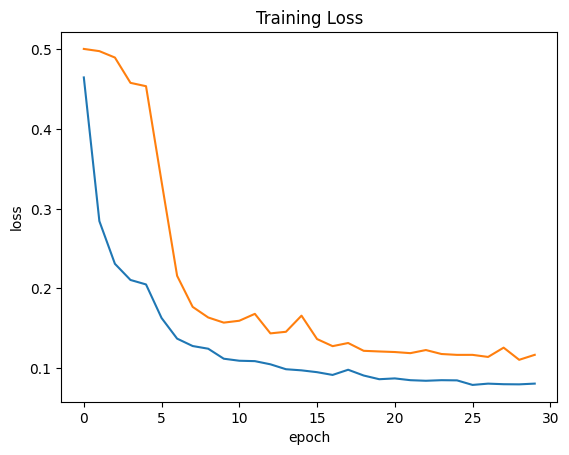

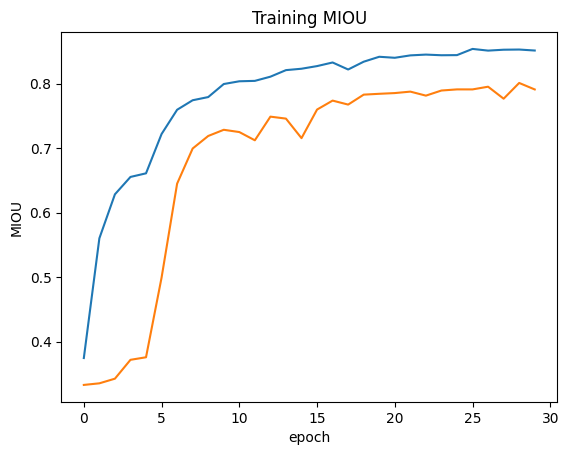

In [24]:
plt.plot(history.history["loss"])
plt.plot(history.history["val_loss"])
plt.title("Training Loss")
plt.ylabel("loss")
plt.xlabel("epoch")
plt.show()
plt.plot(history.history["mean_iou"])
plt.plot(history.history["val_mean_iou"])
plt.title("Training MIOU")
plt.ylabel("MIOU")
plt.xlabel("epoch")
plt.show()

In [26]:
def display_sample(sample_image,sample_mask_seperated,pred_mask_seperated):
    # plt.figure(figsize=(16, 16))
    title = ['bg','fat','cell','bone']
    # for i in range(len(display_list)):
    #     plt.subplot(1, len(display_list), i+1)
    #     plt.title(title[i])
    #     plt.imshow(tf.keras.preprocessing.image.array_to_img(display_list[i]),cmap='gray')
    #     plt.axis('off')
    # plt.show()

    fig,axs=plt.subplots(2,5,figsize=(30,12))
    axs[0][0].imshow(sample_image)
    axs[0][0].axis('off')
    axs[0][0].set_title('Original Image')
    for i in range(4):
        axs[0][i+1].imshow(sample_mask_seperated[i],cmap='gray')
        axs[0][i+1].axis('off')
        axs[0][i+1].set_title(f'Original {title[i]}')
    for i in range(4):
        axs[1][i+1].imshow(pred_mask_seperated[i],cmap='gray')
        axs[1][i+1].axis('off')
        axs[1][i+1].set_title(f'Predicted {title[i]}')
    plt.show()

In [27]:
def create_mask(pred_mask):
    pred_mask = tf.argmax(pred_mask, axis=-1) 
    pred_mask = tf.expand_dims(pred_mask, axis=-1)
    return pred_mask
    
def show_predictions(sample_image,sample_mask):
    one_img = sample_image[0][tf.newaxis, ...] 
    prediction = model.predict(one_img)
    pred_mask = create_mask(prediction)

    sample_mask_seperated=[(sample_mask[0]==i) for i in [0,1,2,3]]
    pred_mask_seperated=[(pred_mask[0]==i) for i in [0,1,2,3]]

    display_sample(sample_image[0], sample_mask_seperated,pred_mask_seperated)#sample_mask_seperated, pred_mask_seperated)
    
    fat_true=np.sum(sample_mask_seperated[1])
    cell_true=np.sum(sample_mask_seperated[2])
    fat_pred=np.sum(pred_mask_seperated[1])
    cell_pred=np.sum(pred_mask_seperated[2])
    cellularity_true=(cell_true*100)/(cell_true+fat_true)
    cellularity_pred=(cell_pred*100)/(cell_pred+fat_pred)
    cellularity_accuracy=(1-abs(cellularity_pred-cellularity_true)/100)*100
    print(f"cellulu true={cellularity_true:.3f}%\tcellulu pred='{cellularity_pred:.3f}%\tDifference={cellularity_accuracy:.3f}%")
    return cellularity_accuracy

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


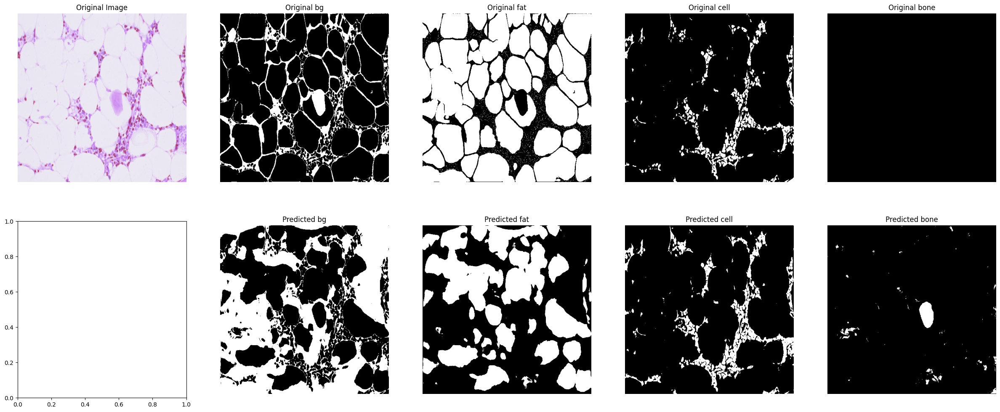

cellulu true=9.352%	cellulu pred='20.683%	Difference=88.669%
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


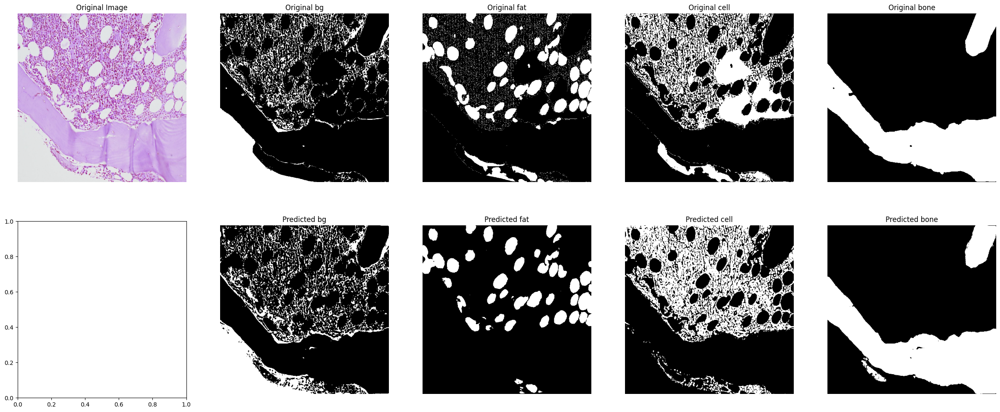

cellulu true=62.413%	cellulu pred='70.742%	Difference=91.672%
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


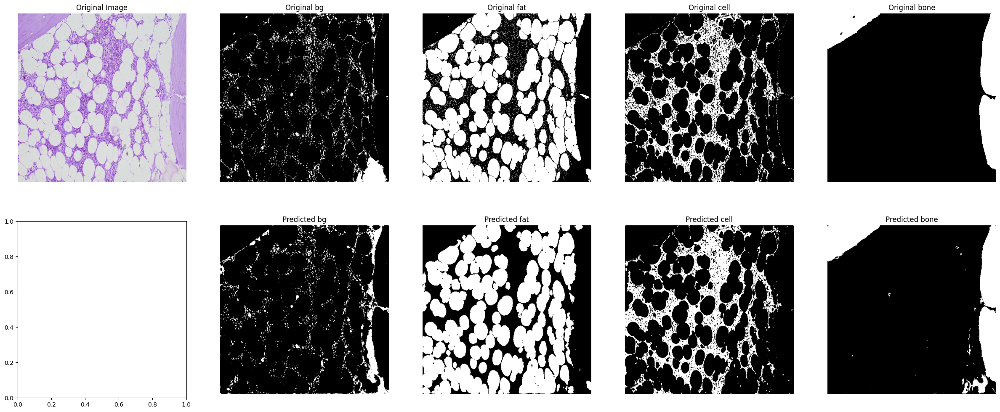

cellulu true=25.452%	cellulu pred='28.789%	Difference=96.663%
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


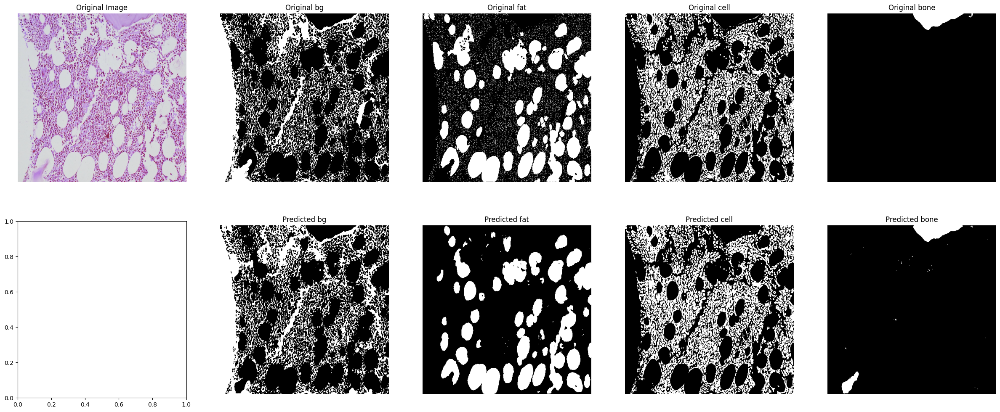

cellulu true=50.845%	cellulu pred='58.902%	Difference=91.943%
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


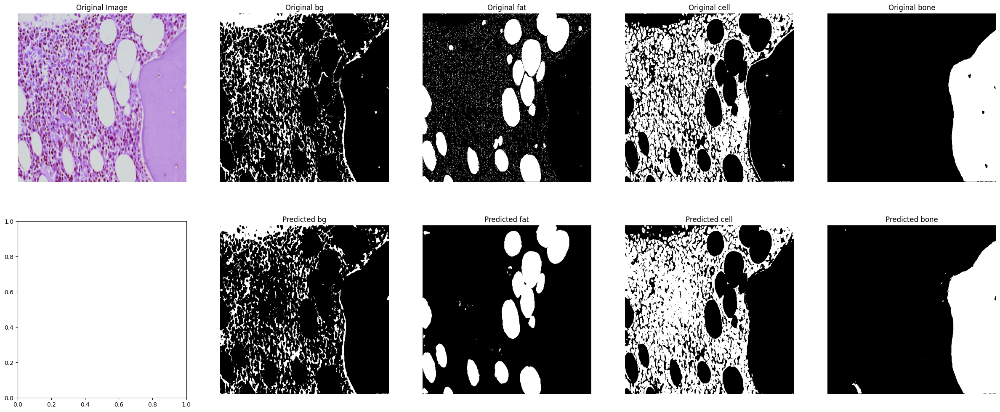

cellulu true=65.769%	cellulu pred='72.743%	Difference=93.025%
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


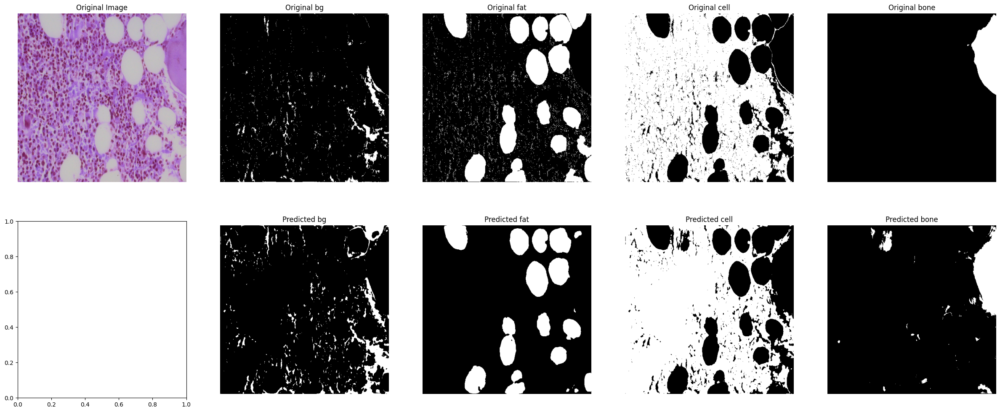

cellulu true=75.874%	cellulu pred='80.244%	Difference=95.630%
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


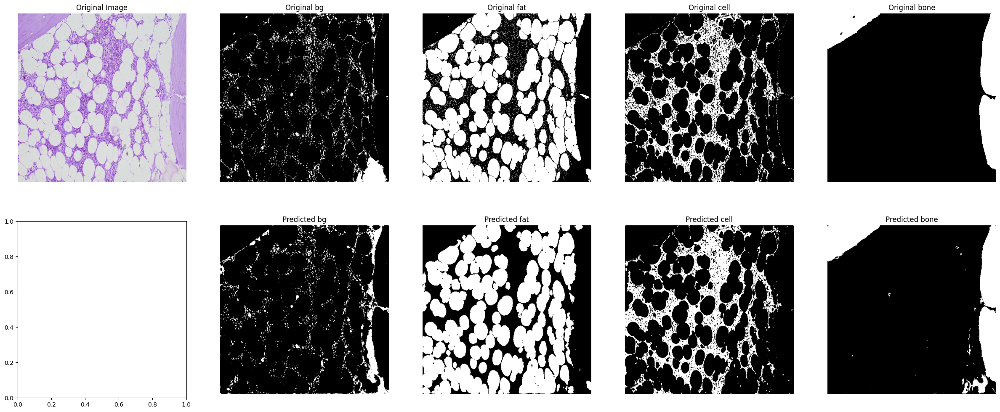

cellulu true=25.452%	cellulu pred='28.789%	Difference=96.663%
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


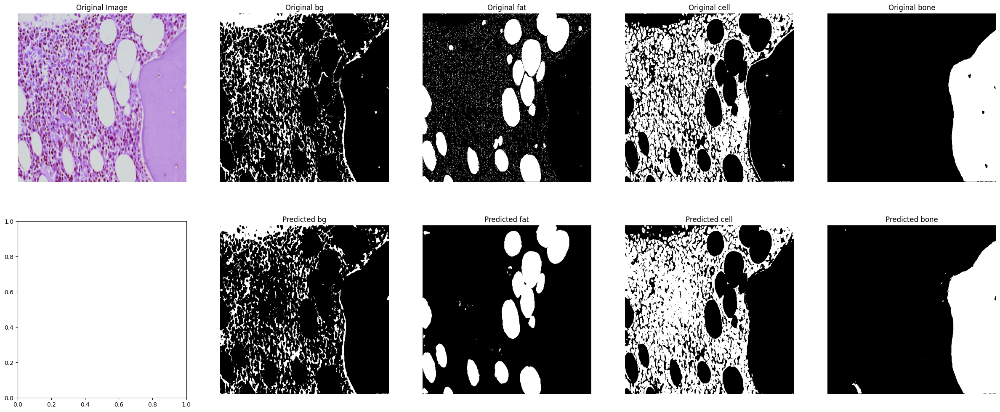

cellulu true=65.769%	cellulu pred='72.743%	Difference=93.025%
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


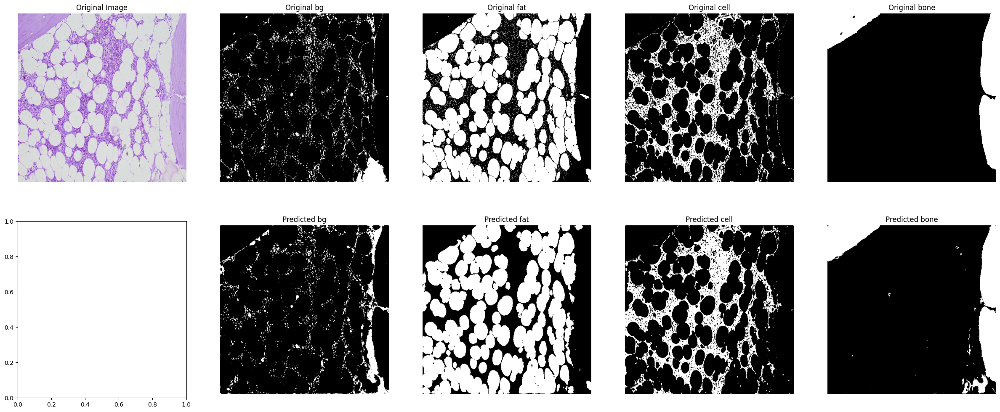

cellulu true=25.452%	cellulu pred='28.789%	Difference=96.663%
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


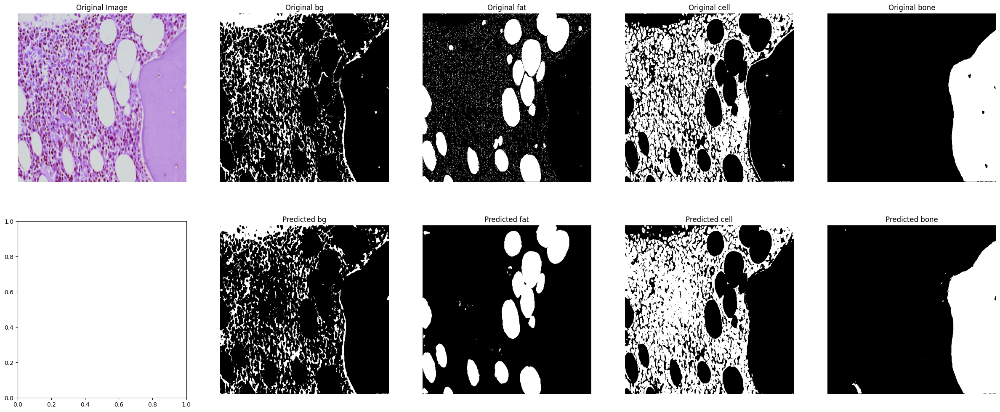

cellulu true=65.769%	cellulu pred='72.743%	Difference=93.025%
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


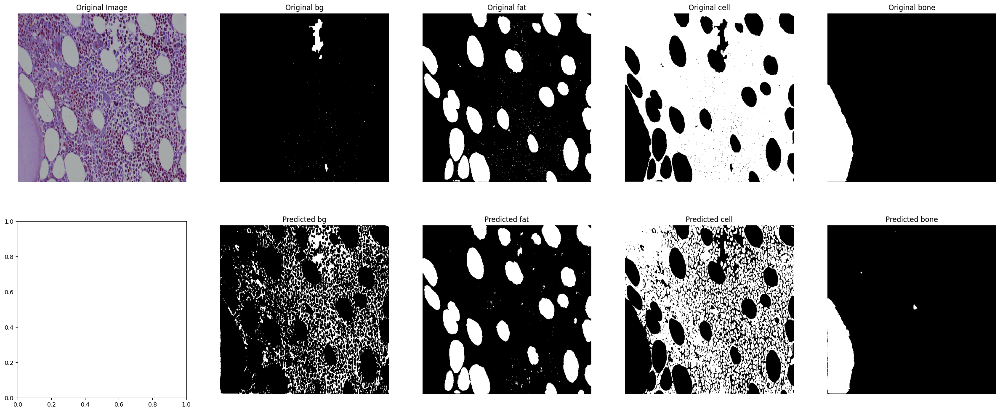

cellulu true=77.484%	cellulu pred='70.925%	Difference=93.441%
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


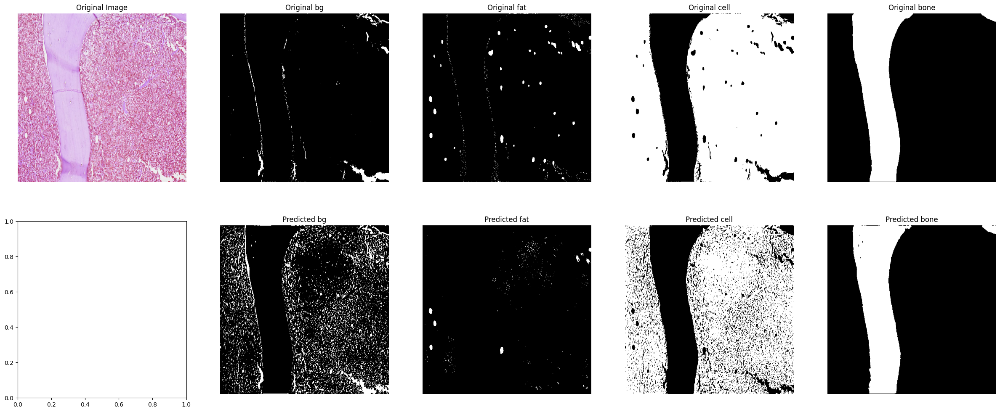

cellulu true=98.218%	cellulu pred='99.060%	Difference=99.159%
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


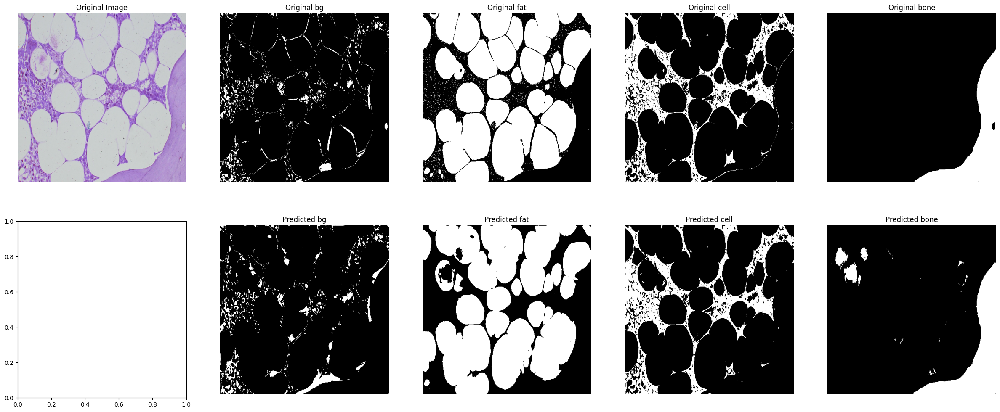

cellulu true=23.052%	cellulu pred='23.442%	Difference=99.610%
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


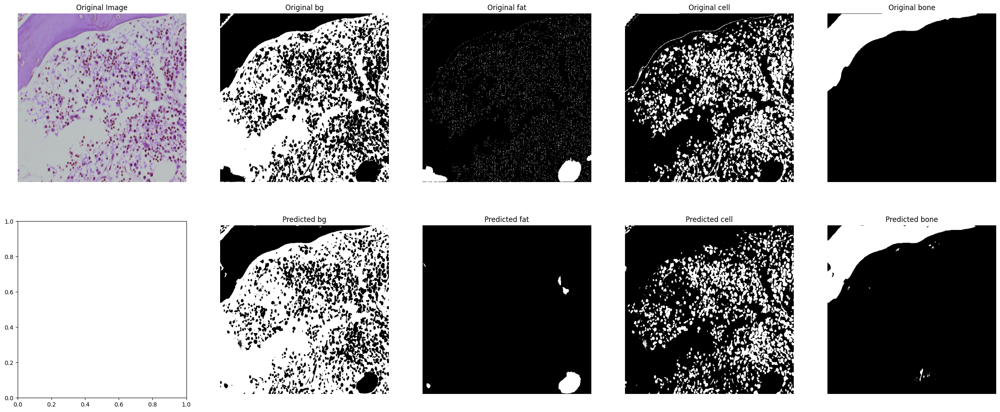

cellulu true=84.041%	cellulu pred='93.951%	Difference=90.090%
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


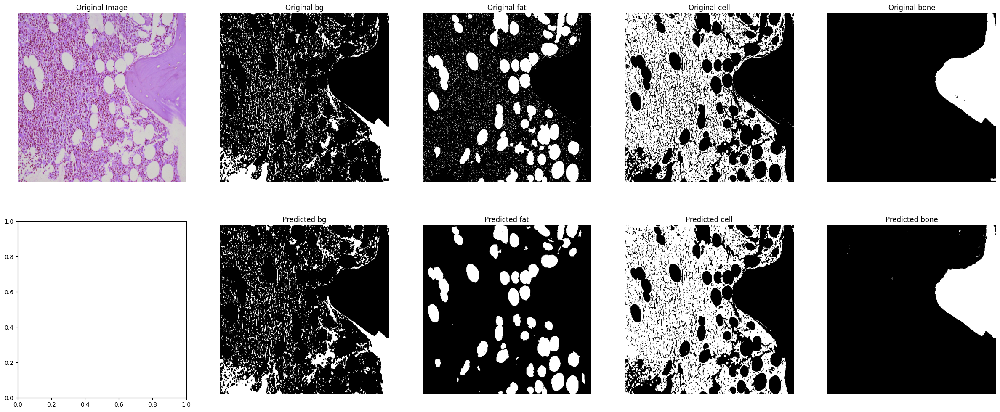

cellulu true=68.499%	cellulu pred='75.378%	Difference=93.121%


2024-05-28 19:34:55.956923: W tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence


In [31]:
# for i in range(15):
net_cellulu=0
totalMasks=15

for image, mask in test_dataset.take(15):
        sample_image, sample_mask = image, mask
        net_cellulu+=show_predictions(sample_image, sample_mask)

In [32]:
test_steps = len(test_x)//batch
if len(test_x) % batch != 0: 
    test_steps += 1

result = model.evaluate(test_dataset, steps=test_steps)
dict(zip(model.metrics_names, result))
print(f"Testing Cellularity Accuracy={(net_cellulu/totalMasks):.3f}%")

1/1 ━━━━━━━━━━━━━━━━━━━━ 16s 16s/step - dice_coef: 0.8978 - loss: 0.1022 - mean_iou: 0.8145
Testing Cellularity Accuracy=94.160%


In [34]:
# model.save('model_saves/VGG16_256.h5')  # Saves in the older HDF5 format
model.save('../../kerasModels/model_saves/VGG19_512.keras')  # Recommended format (uses ZIP archive)